
# Examen
## Leo Carpio

**a) Investigar sobre el software libre LAPACK y BLAS, Sobre su relación con Julia (Revisar documentación y el libro de Burton)**

El software para operaciones de matriz y la solución directa de sistemas lineales implementados en IMSL y NAG está basado en LAPACK, un paquete de subrutinas de dominio público. LAPACK de acompañamiento es un conjunto de operaciones de nivel inferior llamadas Subprogramas Básicos de Álgebra Lineal (BLAS)
    En general, el nivel 1 de BLAS consiste en operaciones vector-vector, como sumas de vector con datos de entrada y conteo de operaciones de $O(n)$. El nivel 2 consiste en operaciones matriz-vector, como el producto de una matriz y un vector con datos de entrada y conteo de operaciones de $O(n^2)$. El nivel 3 consiste en operaciones matriz-matriz, como productos de matriz con datos de entrada y conteo de operaciones de $O(n^3)$.
    Las subrutinas en LAPACK para resolver sistemas lineales primero factorizan la matriz A.
    La factorización depende del tipo de matriz de la siguiente forma:
    
* 1. Matriz general $PA = LU$
* 2. $ A = LL^t $
* 3. Matriz simétrica $A = LDL^t$
* 4. Matriz tridiagonal $A = LU$ (en forma de banda).
(Burden et al., 2017, p. 318)

La relación que tiene con Julia es que, al estar enfocado en el rendimiento, en lugar de ejecutar desde cero operaciones como vector-vector u operaciones de matrices, Julia llama a las funciones de LAPACK y BLAS, las cuales ya han sido optimizadas en el transcurso del tiempo. LAPACK y BLAS tradicionalmente se usan desde C o Fortran, Julia lo que hace es evitar la complejidad de dichos lenguajes y abstraer las funciones en un entorno más amigable.
Esto es algo que hemos utilizado en las implementaciones de los algoritmos a lo largo del curso, desde operaciones vector-vector, operaciones de matrices, soluciones de sistemas lineales, factorización de matrices (operaciones que ya se puede resolver con una función de la libreria), factorización de cholesky, etc. 

**b)Investigar si los mismos métodos de soluciones de sistemas lineales sobre $F = \mathbb{R}$ o $F = \mathbb{C}$ funcionan si $F$ es un campo finito.**

  → **Dar ejemplos para $F = \mathbb{Z}_p$ con al menos 1000 primos distintos  en sistemas de $n \times n$ con $n = 2, 3, \ldots, 100$.**    

Casi todos los algoritmos implementados funcionan en campos finitos. Un campo finito es aquel que utiliza las propiedas básicas como la suma, resta, multiplicación y división, con sus respectivas propiedades (conmutatividad,asociatividad,etc) solo que sus elementos no se extienden hasta el infinito en la recta númerica. El problema es que estos no conocen los conceptos como el valor absoluto o la convergencia ya que al tener números finitos se complica saber qué numero es mas grande que otro y la distancia en la que se encuentran los elementos. Por ejemplo:


Supongamos que tenemos el conjunto $F_{5} = {0,1,2,3,4}$. No podriamos asegurar que $4$ es mayor que $1$, ya que $4+2=1$. Es decir, no hay un orden específico en el que podamos asegurar que un número es mayor a otro, es como si estuvieramos viendo un reloj, sus elementos no son como en la recta numérica, si no cíclicos.


Entonces, volviendo al concepto de **valor absoluto**, básicamente este se define como las unidades a las que se encuentra cualquier valor a la distancia del cero, por ejemplo, el $4$ y $-4$ están a cuatro unidades del cero en la recta numérica, pero en un campo finito, este concepto se pierde, volvamos a $F_{5}$, no podemos calcular de manera correcta la distancia a la que se encuentra el $3$ al cero, ya que desde el 3 al cero pueden haber dos maneras de llegar: una en la que vamos en sentido del reloj (dos unidades) y otra en la que vamos en sentido contrario (tres unidades) ¿Cuál es la correcta?

Lo mismo pasa con la **convergencia**, la convergencia se refiere a la idea de una sucesión o serie de numeros que cada vez se acerca a un valor en específico, pero, como lo vimos anteriormente, en los campos finitos se pierde el concepto de "mayor que" o "menor que", por lo que la convergencia también es pierde su sentido ya que no se puede saber con certeza si esta acercandose a un valor o no.

Por lo tanto, métodos iterativos como Jacobi y Gauss-Seidel **no funcionan** si $F$ es un campo finito ya que son iterativos, es decir, generan una sucesión de soluciones en la que en cada iteración van reduciendo el error y así se van *acercando* a la solución real. 
Además, estos métodos dependen de características de  matrices, por ejemplo que estas sean diagonalmente dominantes y lo cual implica el uso del valor absoluto.



In [2]:
using Random
using Primes   

function modinv(a::Integer, p::Integer)
    a_mod = mod(a, p)
    if a_mod == 0
        error("modinv: no inverso para 0 mod $p")
    end
    r0, r1 = p, a_mod
    s0, s1 = 1, 0
    t0, t1 = 0, 1
    while r1 != 0
        q = fld(r0, r1)
        r0, r1 = r1, r0 - q*r1
        s0, s1 = s1, s0 - q*s1
        t0, t1 = t1, t0 - q*t1
    end
    if r0 != 1
        error("modinv: gcd($a,$p) = $r0 ≠ 1, no inverso")
    end
    return mod(t0, p)
end


function gauss_mod_p(A::Array{Int,2}, b::Array{Int,1}, p::Int)
    n = size(A, 1)
    Ab = [mod(A[i,j], p) for i in 1:n, j in 1:n]
    bb = [mod(b[i], p) for i in 1:n]
    NROW = collect(1:n)

    for i in 1:n-1
        piv = 0
        for j in i:n
            if Ab[NROW[j], i] % p != 0
                piv = j
                break
            end
        end
        if piv == 0
            error("Matriz singular mod $p")
        end
        if NROW[i] != NROW[piv]
            NROW[i], NROW[piv] = NROW[piv], NROW[i]
        end
        pivot_val = Ab[NROW[i], i] % p
        inv_pivot = modinv(pivot_val, p)
        for j in i+1:n
            aji = Ab[NROW[j], i] % p
            if aji != 0
                m = (aji * inv_pivot) % p
                for k in i:n
                    Ab[NROW[j], k] = mod(Ab[NROW[j], k] - m * Ab[NROW[i], k], p)
                end
                bb[NROW[j]] = mod(bb[NROW[j]] - m * bb[NROW[i]], p)
            end
        end
    end

    if Ab[NROW[n], n] % p == 0
        error("Matriz singular mod $p")
    end

    x = zeros(Int, n)
    x[n] = (bb[NROW[n]] * modinv(Ab[NROW[n], n] % p, p)) % p
    for i in (n-1):-1:1
        suma = 0
        for j in i+1:n
            suma = (suma + Ab[NROW[i], j]*x[j]) % p
        end
        numer = mod(bb[NROW[i]] - suma, p)
        denom = Ab[NROW[i], i] % p
        x[i] = (numer * modinv(denom, p)) % p
    end
    return x
end


function trunc_list(lst::Vector{Int}, maxlen::Int=10)
    length(lst) > maxlen ? vcat(lst[1:maxlen], "…") : lst
end

# --- Demo general ---
function demo_1000_primos()
    rng = MersenneTwister(12345)
    primes_1000 = collect(Primes.primes(2, 7919*2))  
    primes_1000 = primes_1000[1:1000]

    println(" Comenzando demostración con 1000 primos \n")

    # para no saturar la salida, solo mostramos un primo por n
    for n in 2:100
        p = primes_1000[n]   # un primo distinto por cada tamaño n
        print("n=$n, p=$p: ")
        A = [rand(rng, 0:p-1) for i in 1:n, j in 1:n]
        x_true = [rand(rng, 0:p-1) for i in 1:n]
        b = [mod(sum(A[i,j]*x_true[j] for j in 1:n), p) for i in 1:n]

        try
            x_calc = gauss_mod_p(A, b, p)
            success = x_calc == x_true
            println(success ? " Éxito" : " Fallo")
            println("  Solución verdadera:  ", trunc_list(x_true))
            println("  Solución calculada: ", trunc_list(x_calc), "\n")
        catch e
            println("Matriz singular, no hay solución única.\n")
        end
    end

    println(">>> Demostración completada <<<")
end


demo_1000_primos()


 Comenzando demostración con 1000 primos 

n=2, p=3: Matriz singular, no hay solución única.

n=3, p=5: Matriz singular, no hay solución única.

n=4, p=7:  Éxito
  Solución verdadera:  [4, 4, 6, 1]
  Solución calculada: [4, 4, 6, 1]

n=5, p=11:  Éxito
  Solución verdadera:  [0, 9, 0, 8, 4]
  Solución calculada: [0, 9, 0, 8, 4]

n=6, p=13:  Éxito
  Solución verdadera:  [11, 9, 8, 4, 0, 5]
  Solución calculada: [11, 9, 8, 4, 0, 5]

n=7, p=17:  Éxito
  Solución verdadera:  [4, 9, 13, 3, 4, 1, 7]
  Solución calculada: [4, 9, 13, 3, 4, 1, 7]

n=8, p=19:  Éxito
  Solución verdadera:  [3, 9, 0, 10, 18, 16, 11, 5]
  Solución calculada: [3, 9, 0, 10, 18, 16, 11, 5]

n=9, p=23:  Éxito
  Solución verdadera:  [6, 0, 18, 20, 7, 11, 4, 17, 16]
  Solución calculada: [6, 0, 18, 20, 7, 11, 4, 17, 16]

n=10, p=29: Matriz singular, no hay solución única.

n=11, p=31:  Éxito
  Solución verdadera:  Any[10, 23, 5, 28, 12, 5, 20, 7, 7, 20, "…"]
  Solución calculada: Any[10, 23, 5, 28, 12, 5, 20, 7, 7, 20, "…

### Explicación 

La eliminación de Gauss se puede aplicar en campos finitos $(\mathbb{Z}_p)$. En este caso, todos los números se consideran **mod \(p\)**, es decir, solo importa el resto al dividir entre \(p\). Las operaciones de suma, resta y multiplicación se hacen módulo \(p\), y la división se reemplaza por multiplicar por el **inverso modular**.  

Una matriz es **invertible mod \(p\)** si su determinante no es divisible por \(p\); en ese caso, el sistema \(A x = b\) tiene una **solución única**. Si la matriz es singular, no existe solución única. Por lo tanto, usando la eliminación de Gauss con estas reglas, podemos resolver sistemas lineales exactos en campos finitos, tal como se demuestra con los ejemplos generados para diferentes primos y dimensiones.


**c)Dada una imagen de color, asociar una matriz **M** y aplicar directamente **SVD****
  para dar una **PCA** usando $2$, $2^2$, $2^3$,... componentes principales.  
  - Repetir usando la matriz de covarianza.  
  - Repetir usando la matriz de correlación
  - Conclusiones de sus resultados.
* Justifique cómo hallar el número idóneo de componentes en la que se pierde menos resolución.


*Se usó SVD usando covarianza y correlación para ahorrar memoria ya que sin esta herramienta los códigos no se ejecutaban*

# PCA correlación

Cargando imagen...
Imagen cargada con tamaño (400, 600)
Componentes a probar: [2, 4, 8, 16, 32, 64, 128, 256]
→ Reconstruyendo con 2 componentes...
→ Reconstruyendo con 4 componentes...
→ Reconstruyendo con 8 componentes...
→ Reconstruyendo con 16 componentes...
→ Reconstruyendo con 32 componentes...
→ Reconstruyendo con 64 componentes...
→ Reconstruyendo con 128 componentes...
→ Reconstruyendo con 256 componentes...
Mostrando resultados...


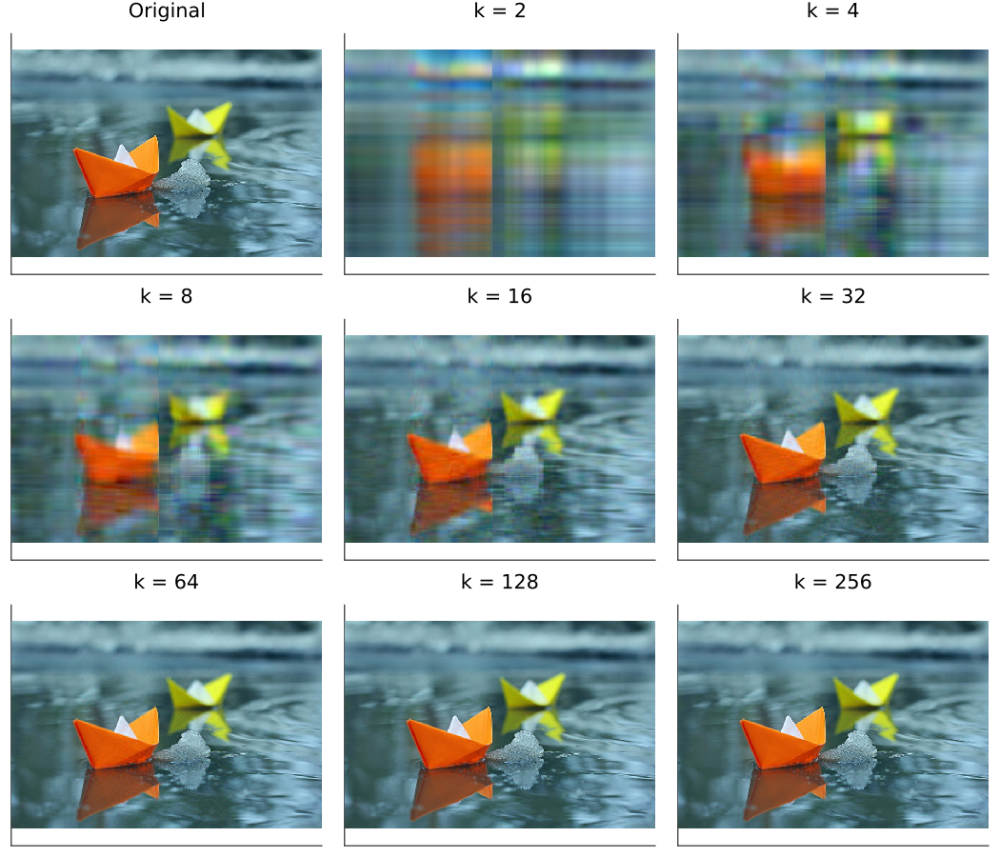

In [1]:
using Images
using LinearAlgebra
using Plots
using Statistics

"""
reconstruye una matriz usando PCA
basado en la matriz de correlación 
"""
function pca_correlacion_imagen_fast(matriz_img::AbstractMatrix{<:Real}, num_componentes::Int)
 
    X = Float32.(matriz_img)

   
    media = mean(X, dims=1)
    Xc = X .- media

    
    stds = std(Xc, dims=1)
    stds[stds .== 0] .= 1f0 
    Xs = Xc ./ stds

    # calcular matriz de correlación 
    
    n = size(Xs, 2)
    Corr = Symmetric((Xs * Xs') / (n - 1))

    # calcular eigenvalores y eigenvectores 
    vals, vecs = eigen(Corr)


    orden = sortperm(vals, rev=true)
    W = vecs[:, orden[1:num_componentes]]


    Z = W' * Xs
    X_rec = (W * Z) .* stds .+ media

    return X_rec
end


function comprimir_imagen_pca_correlacion(ruta_imagen::String)
    println("Cargando imagen...")
    img = load(ruta_imagen)
    println("Imagen cargada con tamaño ", size(img))


    R = Float32.(red.(img))
    G = Float32.(green.(img))
    B = Float32.(blue.(img))

    
    max_componentes = size(R, 1)
    max_potencia = floor(Int, log2(max_componentes))
    ks = [2^p for p in 1:max_potencia]
    println("Componentes a probar: ", ks)

    plots = [plot(img, title="Original", aspect_ratio=:equal, axis=nothing)]

    for k in ks
        println("→ Reconstruyendo con $k componentes...")
        r = pca_correlacion_imagen_fast(R, k)
        g = pca_correlacion_imagen_fast(G, k)
        b = pca_correlacion_imagen_fast(B, k)

        img_rec = colorview(RGB, clamp.(r, 0f0, 1f0), clamp.(g, 0f0, 1f0), clamp.(b, 0f0, 1f0))
        push!(plots, plot(img_rec, title="k = $k", aspect_ratio=:equal, axis=nothing))
    end

    println("Mostrando resultados...")
    ncols = ceil(Int, sqrt(length(plots)))
    nrows = ceil(Int, length(plots) / ncols)
    plot(plots..., layout=(nrows, ncols), size=(350ncols, 300nrows))
end



comprimir_imagen_pca_correlacion("/Users/leocarpio/Downloads/302250.jpg")


# PCA covarianza

Iniciando el proceso de compresión de imagen a COLOR con PCA...
Imagen a color cargada exitosamente.
Dimensiones de las matrices de canal: (400, 600)
Componentes a probar: [2, 4, 8, 16, 32, 64, 128, 256]
Reconstruyendo con 2 componentes...
Reconstruyendo con 4 componentes...
Reconstruyendo con 8 componentes...
Reconstruyendo con 16 componentes...
Reconstruyendo con 32 componentes...
Reconstruyendo con 64 componentes...
Reconstruyendo con 128 componentes...
Reconstruyendo con 256 componentes...
Mostrando resultados...


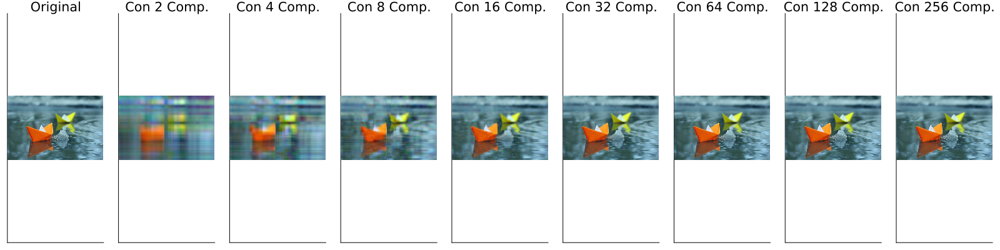

In [2]:
using Images
using LinearAlgebra
using Plots
using Statistics

"""
reconstruye una matriz de 2D usando PCA
basado en la matriz de covarianzas
"""
function pca_covarianza_imagen(matriz_img, num_componentes)
    
    media_por_columna = mean(matriz_img, dims=1)
    matriz_centrada = matriz_img .- media_por_columna

    # calcular la matriz de covarianza
    m, n = size(matriz_centrada)
    matriz_cov = (1 / (n - 1)) * (matriz_centrada * matriz_centrada')

    
    valores_propios, vectores_propios = eigen(matriz_cov)

    
    indices_ordenados = sortperm(valores_propios, rev=true)
    componentes_principales = vectores_propios[:, indices_ordenados]

    
    W_k = componentes_principales[:, 1:num_componentes]

    
    Z = W_k' * matriz_centrada

    
    matriz_reconstruida = W_k * Z .+ media_por_columna
    
    return matriz_reconstruida
end


println("Iniciando el proceso de compresión de imagen a COLOR con PCA...")

try
    global img = load("/Users/leocarpio/Downloads/302250.jpg")
    
    println("Imagen a color cargada exitosamente.")

    matriz_R = Float64.(red.(img))
    matriz_G = Float64.(green.(img))
    matriz_B = Float64.(blue.(img))
    println("Dimensiones de las matrices de canal: ", size(matriz_R))

    max_componentes = size(matriz_R, 1) 
    
    
    max_potencia = floor(Int, log2(max_componentes))
    
    
    global componentes_a_probar = [2^p for p in 1:max_potencia]
    
    println("Componentes a probar: ", componentes_a_probar)
    


    plots_list = []

    
    p_original = plot(img, title="Original", aspect_ratio=:equal, axis=nothing)
    push!(plots_list, p_original)

    
    for k in componentes_a_probar
        println("Reconstruyendo con $k componentes...")
        
        r_reconstruida = pca_covarianza_imagen(matriz_R, k)
        g_reconstruida = pca_covarianza_imagen(matriz_G, k)
        b_reconstruida = pca_covarianza_imagen(matriz_B, k)
        
        r_clamped = clamp.(r_reconstruida, 0, 1)
        g_clamped = clamp.(g_reconstruida, 0, 1)
        b_clamped = clamp.(b_reconstruida, 0, 1)

        img_reconstruida_display = colorview(RGB, r_clamped, g_clamped, b_clamped)
        
        p = plot(img_reconstruida_display, title="Con $k Comp.", aspect_ratio=:equal, axis=nothing)
        push!(plots_list, p)
    end

    # mostrar todos los plots juntos
    println("Mostrando resultados...")
    plot(plots_list..., layout=(1, length(plots_list)), size=(1600, 400))

catch e
    if e isa SystemError
        println("\nError: No se pudo encontrar la imagen en la ruta especificada.")
    else
        rethrow(e)
    end
end

*Se hace el mismo método pero con otra imagen para observar que esta se reconstruye con 16 componentes*

Iniciando el proceso de compresión de imagen a COLOR con PCA...
Imagen a color cargada exitosamente.
Dimensiones de las matrices de canal: (853, 1280)
Componentes a probar: [2, 4, 8, 16, 32, 64, 128, 256, 512]
Reconstruyendo con 2 componentes...
Reconstruyendo con 4 componentes...
Reconstruyendo con 8 componentes...
Reconstruyendo con 16 componentes...
Reconstruyendo con 32 componentes...
Reconstruyendo con 64 componentes...
Reconstruyendo con 128 componentes...
Reconstruyendo con 256 componentes...
Reconstruyendo con 512 componentes...
Mostrando resultados...


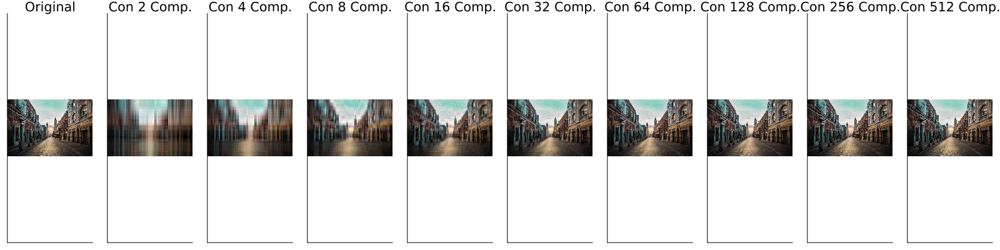

In [1]:
using Images
using LinearAlgebra
using Plots
using Statistics

"""
reconstruye una matriz de 2D  usando PCA
basado en la matriz de covarianzas.
"""
function pca_covarianza_imagen(matriz_img, num_componentes)
    
    media_por_columna = mean(matriz_img, dims=1)
    matriz_centrada = matriz_img .- media_por_columna

    
    m, n = size(matriz_centrada)
    matriz_cov = (1 / (n - 1)) * (matriz_centrada * matriz_centrada')

    
    valores_propios, vectores_propios = eigen(matriz_cov)

    
    indices_ordenados = sortperm(valores_propios, rev=true)
    componentes_principales = vectores_propios[:, indices_ordenados]

    
    W_k = componentes_principales[:, 1:num_componentes]

    
    Z = W_k' * matriz_centrada

    
    matriz_reconstruida = W_k * Z .+ media_por_columna
    
    return matriz_reconstruida
end


println("Iniciando el proceso de compresión de imagen a COLOR con PCA...")

try
    
    global img = load("/Users/leocarpio/Downloads/ciudades-cerca-cdmx-shutterstock-puebla-2.jpg.webp")
    
    println("Imagen a color cargada exitosamente.")

    
    matriz_R = Float64.(red.(img))
    matriz_G = Float64.(green.(img))
    matriz_B = Float64.(blue.(img))
    println("Dimensiones de las matrices de canal: ", size(matriz_R))

    

    
    
    max_componentes = size(matriz_R, 1) 
    
    
    max_potencia = floor(Int, log2(max_componentes))
    
    
    global componentes_a_probar = [2^p for p in 1:max_potencia]
    
    println("Componentes a probar: ", componentes_a_probar)
    
    

    plots_list = []

    
    p_original = plot(img, title="Original", aspect_ratio=:equal, axis=nothing)
    push!(plots_list, p_original)

    
    for k in componentes_a_probar
        println("Reconstruyendo con $k componentes...")
    
        r_reconstruida = pca_covarianza_imagen(matriz_R, k)
        g_reconstruida = pca_covarianza_imagen(matriz_G, k)
        b_reconstruida = pca_covarianza_imagen(matriz_B, k)
        
        r_clamped = clamp.(r_reconstruida, 0, 1)
        g_clamped = clamp.(g_reconstruida, 0, 1)
        b_clamped = clamp.(b_reconstruida, 0, 1)

        img_reconstruida_display = colorview(RGB, r_clamped, g_clamped, b_clamped)
        
        p = plot(img_reconstruida_display, title="Con $k Comp.", aspect_ratio=:equal, axis=nothing)
        push!(plots_list, p)
    end

    # mostrar todos los plots juntos
    println("Mostrando resultados...")
    plot(plots_list..., layout=(1, length(plots_list)), size=(1600, 400))

catch e
    if e isa SystemError
        println("\nError: No se pudo encontrar la imagen en la ruta especificada.")
    else
        rethrow(e)
    end
end

Antes de pasar a las conclusiones, entendamos la diferencia entre usar la matriz de covarianza y la matriz de correlación. La diferencia es que la covarianza nos dice si dos variables se mueven en la misma dirección, pero el valor numérico depende de la escala, por ejemplo, imaginemos que queremos saber la relación entre el peso y la altura, si medimos la alutra en milímetros tendríamos un numero gigante, lo que haría parecer que la altura es más importante. Mientras que la correlación al hacer uso de la estandarización nos dice la fuerza de la relación en una escala de -1 a 1.

En este caso de reconstrucción de imágenes, la covarianza puede dar prioridad a los canales de color que tienen más contraste y por lo tanto mayor varianza. Entonces esto puede ocasionar que se le de más importancia a canales que tengan más contraste pero costaría enfoque en los demás. Mientras que la correlación le da la misma importancia a todos los canales, lo que daría una reconstrucción más balanceada pero podría ocasionar una pérdida de detalle en zonas con mucho contraste o bordes.

Ahora, podemos observar que en los 3 casos, la imagen se ve practicamente reconstruida con 16 componentes, esto se debe en parte a como elegimos reconstruir la imagen, que fue en potencias de 2.
Pensemos en la varianza como la cantidad de información importante que almacena cada componente, por lo que, los primeros componentes capturan la información más esencial, como la forma o colores principales de la imagen, y lo siguientes componentes capturan detalles más particulares o más pequeños, como los detalles mas finos de la imagen, y es por eso que la diferencia en las ultimas imagenes es casi imperceptible. 
Entonces, calculando la varianza acumulada de manera intuitiva, podemos observar que en la cuarta iteración (16 componentes) se llega a alrededor del 90% de la varianza, es decir, el 90% de la información de la imagen, podemos generalizar y decir que la mayoría de las imagenes llegaría a estar en su mayoría reconstruida  con alrededor de 16 componentes, que en este caso es especificamente 16 a causa de como elegimos reconstruir la imagen (en potencias de 2)